# **The doors of San Miguel de Allende 🚪**

# **Las puertas de San Miguel de Allende 🚪**

---

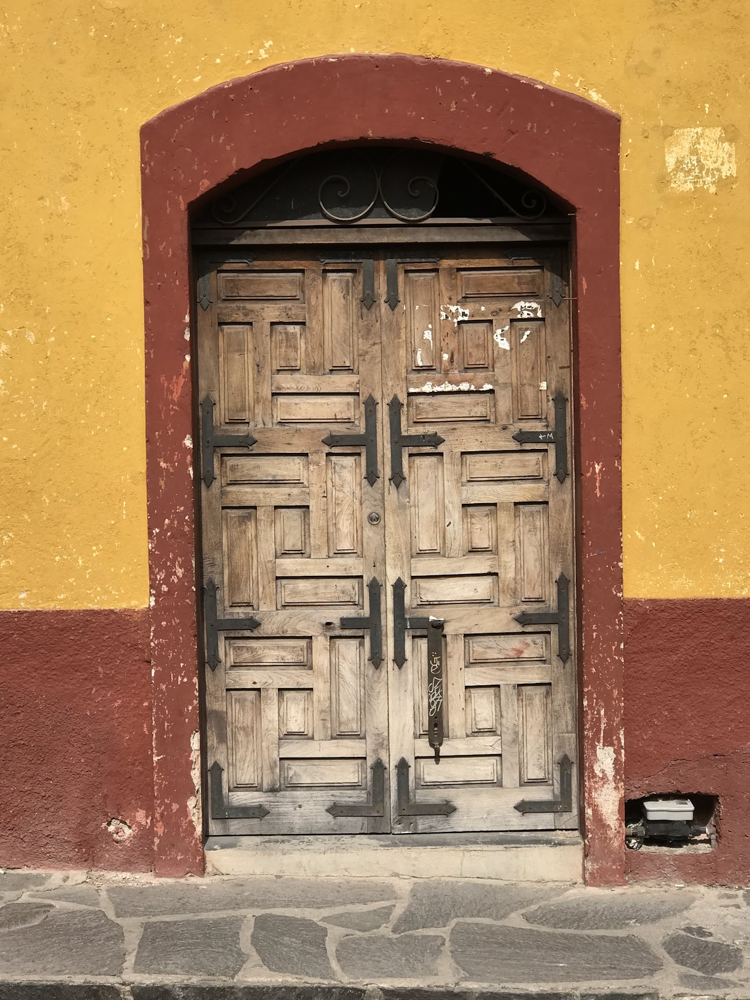

## Introduction

Welcome to an exciting project that will immerse us in the heart of Mexican culture and architecture! On our trip to the vibrant cities of San Miguel de Allende and Guanajuato, you'll notice that both exude a unique beauty through their colors and design.

San Miguel de Allende stands out for its warm tones: reds, ochres, golds, and oranges that dominate the architectural palette. In contrast, Guanajuato is an explosion of color, with a more varied mix of yellows, greens, oranges, blues, purples, and magentas. Both cities share a heritage of colonial Spanish architecture with significant influences from the Middle East. This heritage is manifested in their beautiful inner courtyards, which contrast with the street facades, where the only hint of the inner beauty is the door.

In this project, you will become data scientists, capturing the essence of these cities through their doors. Your task is to take photos of the doors of San Miguel de Allende and Guanajuato. It's crucial that the photos are in a vertical (portrait) orientation and that the door is in the center of the image.

The folder las_puertas_de_SMA in this repository contains a set of photos of doors of San Miguel de Allende. The notebook las_puertas_de_SMA.ipynb will guide you through the code to load these photos as a NumPy array and perform a Principal Component Analysis (PCA).

PCA is a dimensionality reduction technique. It allows us to analyze and visualize important patterns in our data efficiently. It accomplishes this by using eigenvectors which, in our case, will reveal the dominant patterns of color and shape in the doors of San Miguel de Allende. These visual patterns are what we call "eigen-puertas".

I'm excited to see the patterns you discover!

---
## Introducción

¡Bienvenidos a un emocionante proyecto que nos sumergirá en el corazón de la cultura y la arquitectura mexicanas! En nuestro viaje a las vibrantes ciudades de San Miguel de Allende y Guanajuato, notarán que ambas irradian una belleza única a través de sus colores y diseño.

San Miguel de Allende se distingue por sus tonos cálidos: rojos, ocres, dorados y naranjas que dominan la paleta arquitectónica. Por el contrario, Guanajuato es una explosión de color, con una mezcla más variada de amarillos, verdes, naranjas, azules, morados y magentas. Ambas ciudades comparten una herencia de arquitectura colonial española con influencias significativas de Oriente Medio. Esta herencia se manifiesta en sus hermosos patios interiores, que contrastan con las fachadas de las calles, donde la única pista de la belleza interior es la puerta.

En este proyecto, ustedes se convertirán en científicos de datos, capturando la esencia de estas ciudades a través de sus puertas. Su tarea es tomar fotos de las puertas de San Miguel de Allende y Guanajuato. Es crucial que las fotos sean en orientación vertical (retrato) y que la puerta esté en el centro de la imagen.

El folder las_puertas_de_SMA en este repositorio contiene un conjunto de fotos de puertas de San Miguel de Allende. El notebook las_puertas_de_SMA.ipynb les guiará a través del código para cargar estas fotos como un array de NumPy y realizar un Análisis de Componentes Principales (PCA).

El PCA es una técnica de reducción de dimensionalidad. Nos permite analizar y visualizar patrones importantes en nuestros datos de manera eficiente. Lo logra utilizando eigenvectores que, en nuestro caso, revelarán los patrones dominantes de color y forma en las puertas de San Miguel de Allende. Estos patrones visuales son lo que llamamos "eigen-puertas".

¡Estoy emocionado de ver los patrones que descubran!

## **Lesson 1: Image Preprocessing** 🖼️
## **Lección 1: Preprocesamiento de Imágenes** 🖼️

The first step in any data science project is preparing your data. We'll use photos of doors from San Miguel de Allende (SMA) to build our dataset. To make sure all our photos are consistent, we need to normalize them.

El primer paso en cualquier proyecto de ciencia de datos es preparar los datos. Usaremos fotos de puertas de San Miguel de Allende (SMA) para construir nuestro conjunto de datos. Para asegurarnos de que todas nuestras fotos sean consistentes, necesitamos normalizarlas.

---

### **Step 1: Get Your Data Ready**

First, let's get our environment ready. We'll need a few libraries for our work.
* **`numpy`**: For handling our image data as arrays of numbers.
* **`matplotlib`**: To visualize our photos.

Run the following code cell to import these libraries.

### **Paso 1: Preparar Nuestro Entorno**
Primero, preparemos nuestro entorno. Necesitaremos algunas librerías para nuestro trabajo.
* **`numpy`**: Para manejar nuestros datos de imagen como arrays de números.
* **`matplotlib`**: Para visualizar nuestras fotos.

Ejecute la siguiente celda de código para importar estas librerías.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

# Create a variable for the path to your SMA photo folder.
# Make sure the folder name here matches what you've named it!
# Unless you specify a path, place the folder in the same directory as this notebook
sma_folder = 'las_puertas_de_SMA'

--- 
### **Step 2: Read in the Photos**
Now, we'll write a simple function to read all the photos from a folder and convert them into a format that a computer can understand: **a NumPy array**. This is our first step in turning images into data.

Each image is made up of pixels. For a color photo, each pixel has three values (one for Red, one for Green, and one for Blue). So, a photo becomes a 3-dimensional grid of numbers. This is represented as a 4D array: number of photos by width by height by RGB channels.

Run the code cell below to define the function.

### **Paso 2: Leer las Fotos**
Ahora, escribiremos una función simple para leer todas las fotos de una carpeta y convertirlas a un formato que una computadora pueda entender: **un array de NumPy**. Este es nuestro primer paso para convertir imágenes en datos.

Cada imagen está compuesta por píxeles. En una foto a color, cada píxel tiene tres valores (uno para Rojo, uno para Verde y uno para Azul). Por lo tanto, una foto se convierte en una cuadrícula de números tridimensional. Cuando agrupamos todas nuestras fotos, esto se representa como un array de 4 dimensiones: número de fotos, por alto, por ancho, por canales RGB.

Ejecute la siguiente celda de código para definir la función.

In [13]:
def load_images_from_folder(folder):
    images = []
    folder_path = Path(folder)

    if not folder_path.exists():
        print(f"❌ Error: Folder '{folder}' not found.")
        return []

    # Look for common image file extensions, both lowercase and uppercase
    supported_extensions = ['*.jpg', '*.JPG', '*.jpeg', '*.JPEG', '*.png', '*.PNG']

    for ext in supported_extensions:
        for filename in folder_path.glob(ext):
            try:
                img = Image.open(filename)
                images.append(np.array(img))
            except Exception as e:
                print(f"❌ Could not load {filename}: {e}")

    print(f"✅ Loaded {len(images)} images from '{folder}'.")
    return images

---
### **Step 3: Create Our San Miguel Dataset**
Now, we'll use our load_images_from_folder function to load the images from your SMA folder. This will create a list of NumPy arrays for our analysis.

Run the following cell to load your photos.

### **Paso 3: Crear Nuestro Conjunto de Datos de San Miguel**
Ahora, usaremos nuestra función load_images_from_folder para cargar las imágenes de tu carpeta de SMA. Esto creará una lista de arrays de NumPy para nuestro análisis.

Ejecuta la siguiente celda para cargar tus fotos.

In [14]:
sma_images = load_images_from_folder(sma_folder)

✅ Loaded 109 images from 'las_puertas_de_SMA'.


If you like, check the size and dimensions of the array you just created. It should be your number of images, the dimensions of your photos, and the 3 RGB channels.

Si quieres, comprueba el tamaño y las dimensiones del array que acabas de crear. Debería ser tu número de imágenes, las dimensiones de tus fotos, y los 3 canales RGB.

In [43]:
print("The dimensions of our array are:", np.shape(sma_images))

The dimensions of our array are: (109, 1000, 750, 3)


---
### **Step 4: Visualize a Photo**
To make sure everything worked correctly, let's look at one of the photos from our dataset. We'll use `matplotlib` to display the first image in our `sma_images` list.

### **Paso 4: Visualizar una Foto**
Para asegurarte de que todo funcionó correctamente, vamos a ver una de las fotos de nuestro conjunto de datos. Usaremos `matplotlib` para mostrar la primera imagen de nuestra lista `sma_images`.

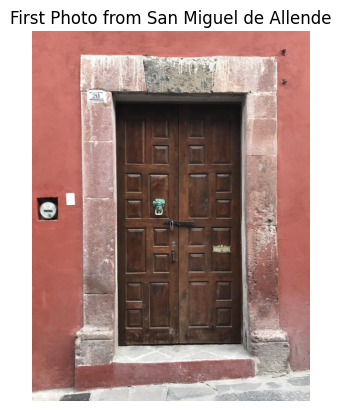

Dimensions of the image: (1000, 750, 3)


In [44]:
# Select the first image from the SMA list by index
first_sma_image = sma_images[0]

# Display the image
plt.imshow(first_sma_image)
plt.title("First Photo from San Miguel de Allende")
plt.axis('off')  # Hide the axes for a cleaner look
plt.show()

# You can also see the dimensions of the photo
print(f"Dimensions of the image: {first_sma_image.shape}")

---
### **Step 5: Visualize All Photos in a Grid 📸**
It's a good practice to quickly check your entire dataset. Let's create a grid of all the images to make sure they all loaded correctly and have a consistent appearance.

### **Paso 5: Visualizar Todas las Fotos en una Cuadrícula 📸**
Es una buena práctica verificar rápidamente todo tu conjunto de datos. Vamos a crear una cuadrícula con todas las imágenes para asegurarnos de que se cargaron correctamente y tienen una apariencia consistente.

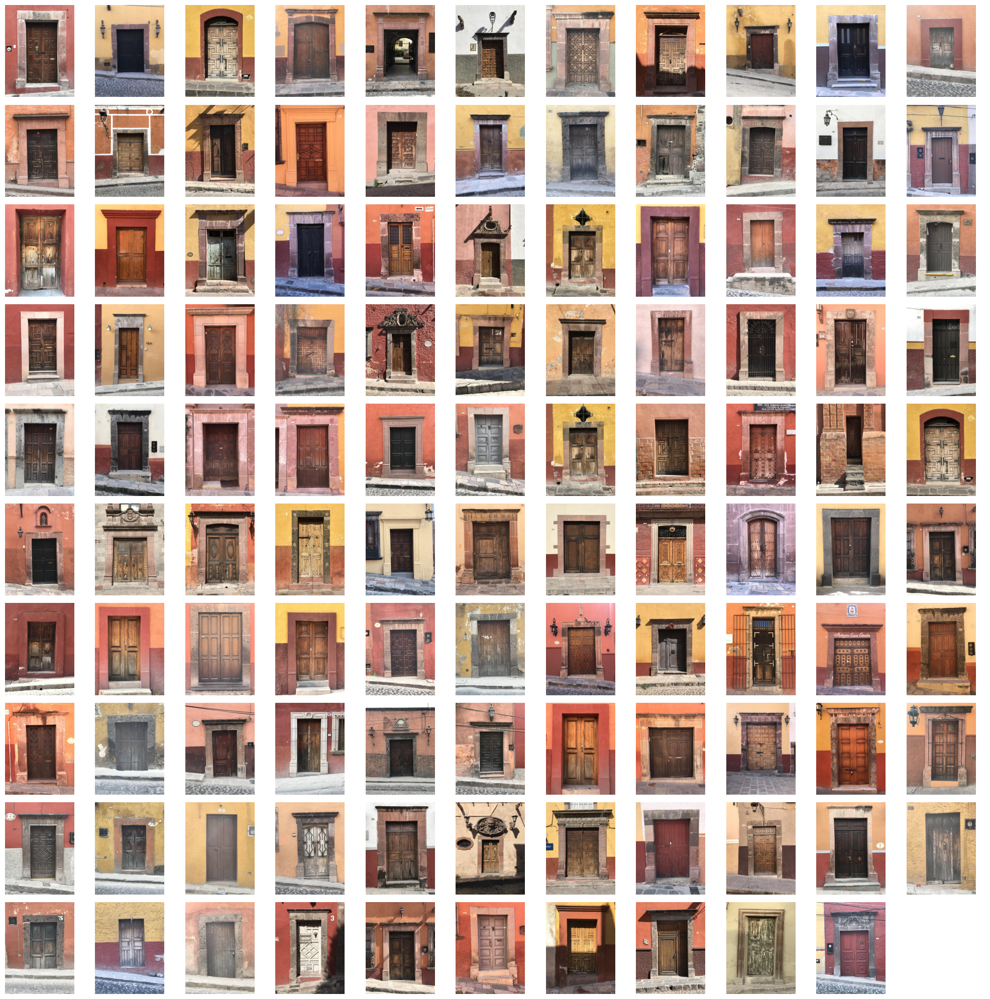

In [21]:
# Create a figure with a grid of subplots
n_images = len(sma_images)
# Calculate the number of rows and columns for a roughly square grid
cols = int(np.ceil(np.sqrt(n_images)))
rows = int(np.ceil(n_images / cols))

fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
# Flatten the axes array to easily iterate through it
axes = axes.flatten()

# Loop through each image and plot it
for i, img in enumerate(sma_images):
    axes[i].imshow(img)
    # axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## **Lesson 2: Flattening Images for PCA 📊**  
## **Lección 2: Aplanar Imágenes para PCA 📊**

Now that we have our images loaded as NumPy arrays, we need to get them ready for Principal Component Analysis (PCA). PCA is a powerful technique that helps us find the most important patterns in our data. It works by treating each image as a single, long vector of numbers. 

Ahora que hemos cargado nuestras imágenes como arrays de NumPy, necesitamos prepararlas para el Análisis de Componentes Principales (PCA). El PCA es una técnica poderosa que nos ayuda a encontrar los patrones más importantes en nuestros datos. Funciona tratando cada imagen como un solo y largo vector de números.

---

### **Step 1: Flatten the Images**
Our images are currently a 3-dimensional array (height, width, color channels). To use PCA, we need to "flatten" each image into a single, 1-dimensional vector. For example, if your images are 750 pixels by 1000 pixels with 3 color channels, each image will become a vector with 750 * 1000 * 3 numbers.

We'll use a simple function to flatten our images and create a single NumPy array containing all of our images.

### **Paso 1: Aplanar las Imágenes**
Nuestras imágenes son actualmente un array de 3 dimensiones (alto, ancho, canales de color). Para usar el PCA, necesitamos "aplanar" cada imagen en un solo vector de 1 dimensión. Por ejemplo, si tus imágenes tienen 750 píxeles por 1000 píxeles con 3 canales de color, cada imagen se convertirá en un vector con 750×1000×3 números.

Usaremos una función simple para aplanar nuestras imágenes y crear un único array de NumPy que contenga todas nuestras imágenes.

In [22]:
def flatten_images(image_list):
    """
    Flattens a list of images into a single NumPy array for PCA.
    """
    if not image_list:
        return np.array([])
    
    # Get the dimensions of the first image to find the size of the flattened vector
    height, width, channels = image_list[0].shape
    vector_size = height * width * channels
    
    # Create an empty array to hold all the flattened images
    all_images_flat = np.zeros((len(image_list), vector_size), dtype=np.float32)
    
    for i, img in enumerate(image_list):
        # Flatten the image and normalize pixel values to be between 0 and 1
        all_images_flat[i, :] = img.flatten() / 255.0
        
    return all_images_flat

# Flatten our SMA images
sma_data = flatten_images(sma_images)

print(f"Original number of images: {len(sma_images)}")
print(f"Shape of flattened data for PCA: {sma_data.shape}")

Original number of images: 109
Shape of flattened data for PCA: (109, 2250000)


## **Lesson 3: Performing PCA 🤖**
## **Lección 3: Realizando PCA 🤖**
Now that our data is in the correct format, we can perform PCA to find the "eigen-puertas," or the most dominant patterns of color and shape in our dataset. We'll use the scikit-learn library, a very popular tool for machine learning in Python.

Ahora que nuestros datos están en el formato correcto, podemos realizar el PCA para encontrar las "eigen-puertas", o los patrones más dominantes de color y forma en nuestro conjunto de datos. Usaremos la librería scikit-learn, una herramienta muy popular para el aprendizaje automático en Python.

--- 

### **Step 1: Install scikit-learn**
If you don't have this library yet, you'll need to install it. Run the following command in a separate terminal window or right here in your notebook:

### **Paso 1: Instalar scikit-learn**
Si aún no tienes esta librería, necesitarás instalarla. Ejecuta el siguiente comando en una ventana de terminal separada o aquí mismo en tu notebook:

In [23]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


---
### **Step 2: Run PCA**
We will use PCA to reduce the hundreds of thousands of pixel values down to just a few key components. We'll start by looking at the first 30 components.

### **Paso 2: Ejecutar PCA**
Usaremos el PCA para reducir los cientos de miles de valores de píxeles a solo unos pocos componentes clave. Empezaremos observando los primeros 30 componentes.

In [24]:
from sklearn.decomposition import PCA

# Create a PCA model with 30 components
n_components = 30
pca = PCA(n_components=n_components)

# Fit the model to our flattened data
pca.fit(sma_data)

print("PCA analysis complete!")
print(f"The shape of the principal components is: {pca.components_.shape}")

PCA analysis complete!
The shape of the principal components is: (30, 2250000)


## **Lesson 4: Visualizing the Results 🖼️**
## **Lección 4: Visualizando los Resultados 🖼️**
The real fun begins here! PCA gives us "eigenvectors," which we can reshape back into images. These "eigen-puertas" represent the most important visual variations across our entire dataset.

Lección 4: Visualizando los Resultados 🖼️
¡Aquí es donde empieza la verdadera diversión! El PCA nos da "eigenvectores", que podemos remodelar para convertirlos de nuevo en imágenes. Estas "eigen-puertas" representan las variaciones visuales más importantes en todo nuestro conjunto de datos.

--- 

### **Step 1: Reshape and Visualize Eigen-Puertas**
First, we need to create a function that takes our flattened vectors and reshapes them back into images. We'll then visualize a few of the principal components to see the main patterns.

### **Paso 1: Remodelar y Visualizar las Eigen-Puertas**
Primero, necesitamos crear una función que tome nuestros vectores aplanados y los remodele de nuevo en imágenes. Luego, visualizaremos algunos de los componentes principales para ver los patrones principales.

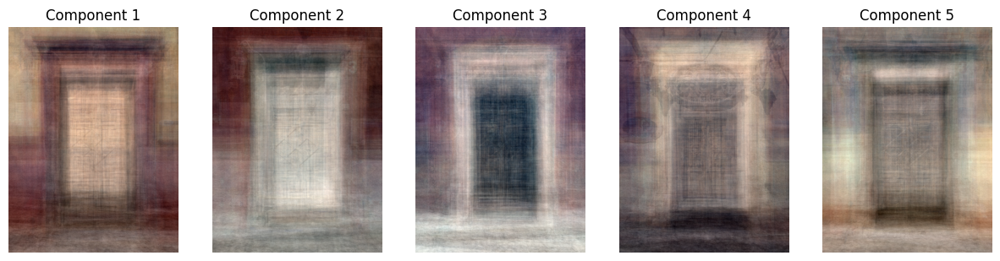

In [25]:
def reshape_vector_to_image(vector, original_shape):
    """
    Reshapes a flattened vector back into a properly scaled image.
    """
    # Scale the values from the PCA vector to the [0, 1] range
    min_val = vector.min()
    max_val = vector.max()
    normalized_vector = (vector - min_val) / (max_val - min_val)
    
    # Rescale the values to the [0, 255] range and convert to unsigned 8-bit integers
    image_array = (normalized_vector * 255).astype(np.uint8)
    
    # Reshape the array to the original image dimensions
    return image_array.reshape(original_shape)

# Get the original dimensions from the first image
original_shape = sma_images[0].shape

# Visualize the first few principal components
plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    # The components are stored in pca.components_
    eigen_puerta = reshape_vector_to_image(pca.components_[i], original_shape)
    plt.imshow(eigen_puerta)
    plt.title(f"Component {i+1}")
    plt.axis('off')
plt.show()


--- 
### **Step 2: Project Data onto Principal Components**
First, we'll use our trained PCA model to transform our original flattened image data (sma_data) into a new, lower-dimensional space. We will project our data onto the first two principal components (PC1 and PC2).

### **Paso 2: Proyectar los Datos en los Componentes Principales**
Primero, usaremos nuestro modelo de PCA entrenado para transformar los datos de imagen aplanados originales (sma_data) en un nuevo espacio de menor dimensión. Proyectaremos nuestros datos sobre los dos primeros componentes principales (PC1 y PC2).

In [26]:
# Project the flattened data onto the first 2 principal components
sma_projected = pca.transform(sma_data)

# The shape of the new data will be (number of images, 2)
print(f"Shape of projected data: {sma_projected.shape}")

Shape of projected data: (109, 30)


---
### **Step 3: Plot the Results on a Scatter Plot**
Now, we will create a scatter plot. Each point on the plot represents a single door photo, with its position determined by its values on PC1 and PC2. This visualization helps us see which doors are similar (points that are close together) and which are different (points that are far apart).

### **Paso 3: Trazar los Resultados en un Gráfico de Dispersión**
Ahora, crearemos un gráfico de dispersión. Cada punto en el gráfico representa una sola foto de puerta, con su posición determinada por sus valores en PC1 y PC2. Esta visualización nos ayuda a ver qué puertas son similares (puntos que están cerca unos de otros) y cuáles son diferentes (puntos que están lejos).

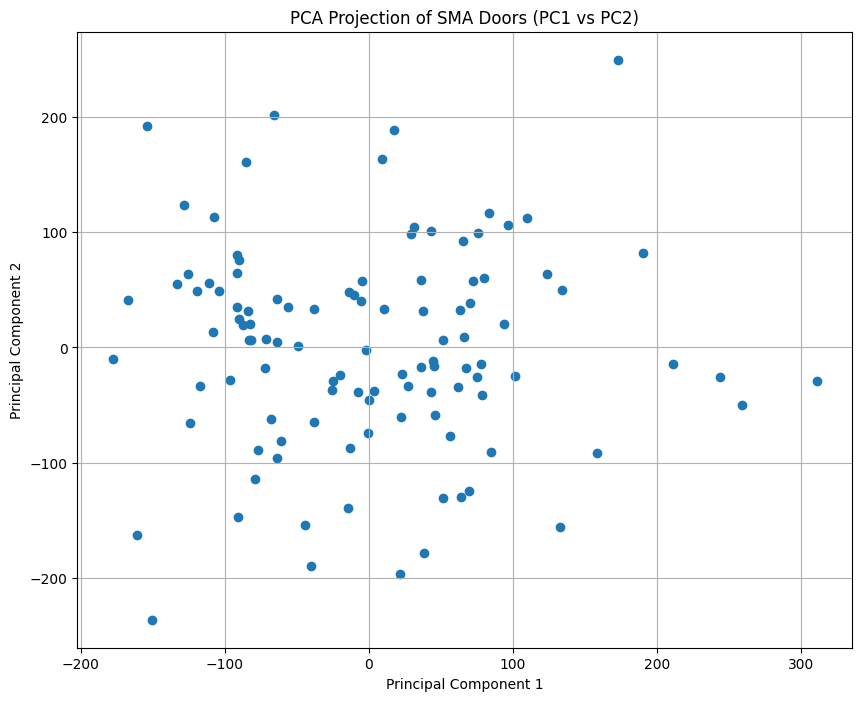

In [27]:
plt.figure(figsize=(10, 8))
plt.scatter(sma_projected[:, 0], sma_projected[:, 1])
plt.title("PCA Projection of SMA Doors (PC1 vs PC2)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)
plt.show()

---
### **Step 4: Bringing It All Together 🧠**
Now, let's combine our visualizations to see how the eigen-puertas relate to the data points on the scatter plot. The two "eigen-puertas" we've been looking at—the first two principal components—are the axes of our scatter plot. They tell us the most important directions of variation in our dataset. The position of each door on the scatter plot is determined by how much it contains of these two visual patterns.

We'll create a single figure that displays the scatter plot alongside the first two eigen-puertas, giving us a powerful, unified view of our analysis.

### **Paso 4: Uniendo Todo 🧠**
Ahora, combinemos nuestras visualizaciones para ver cómo las eigen-puertas se relacionan con los puntos de datos en el gráfico de dispersión. Las dos "eigen-puertas" que hemos estado viendo—los primeros dos componentes principales—son los ejes de nuestro gráfico de dispersión. Nos dicen las direcciones más importantes de variación en nuestro conjunto de datos. La posición de cada puerta en el gráfico de dispersión está determinada por cuánto contiene de estos dos patrones visuales.

Crearemos una sola figura que muestre el gráfico de dispersión junto con las dos primeras eigen-puertas, dándonos una vista unificada y poderosa de nuestro análisis.

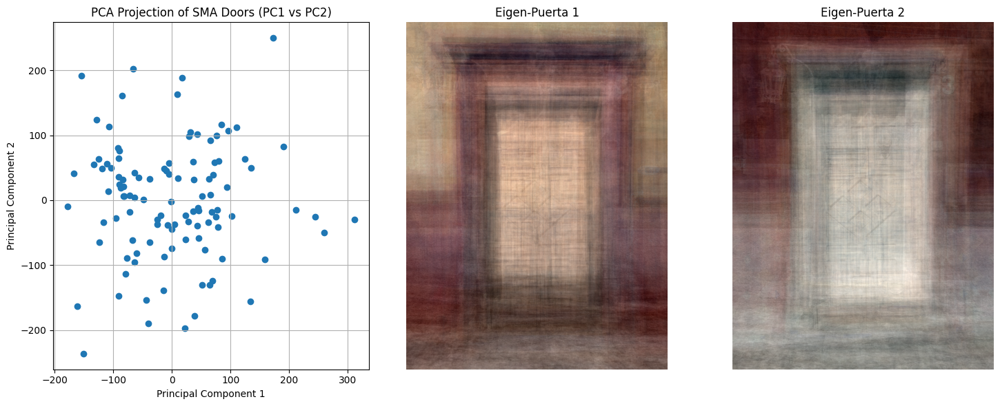

In [28]:
# Create a figure with a main plot and two smaller subplots
fig = plt.figure(figsize=(15, 6))

# Main scatter plot
ax1 = fig.add_subplot(1, 3, 1)
ax1.scatter(sma_projected[:, 0], sma_projected[:, 1])
ax1.set_title("PCA Projection of SMA Doors (PC1 vs PC2)")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.grid(True)

# First Eigen-Puerta (PC1)
ax2 = fig.add_subplot(1, 3, 2)
# The first component is at index 0
eigen_puerta_1 = reshape_vector_to_image(pca.components_[0], original_shape)
ax2.imshow(eigen_puerta_1)
ax2.set_title("Eigen-Puerta 1")
ax2.axis('off')

# Second Eigen-Puerta (PC2)
ax3 = fig.add_subplot(1, 3, 3)
# The second component is at index 1
eigen_puerta_2 = reshape_vector_to_image(pca.components_[1], original_shape)
ax3.imshow(eigen_puerta_2)
ax3.set_title("Eigen-Puerta 2")
ax3.axis('off')

plt.tight_layout()
plt.show()

--- 
### **Step 5: Visualizing Doors on the Scatter Plot 🖼️**
A powerful way to understand our PCA plot is to see the actual doors plotted directly at their coordinates. This shows us what kind of visual features correspond to different positions on the plot. We'll plot a random sample of our doors to keep the visualization clean and easy to read. You can adjust the sample_size and scale_factor to change the number of images plotted and how large they appear.

### **Paso 5: Visualizando Puertas en el Gráfico de Dispersión 🖼️**
Una forma poderosa de entender nuestro gráfico de PCA es ver las puertas reales trazadas directamente en sus coordenadas. Esto nos muestra qué tipo de características visuales corresponden a diferentes posiciones en el gráfico. Trazaremos una muestra aleatoria de nuestras puertas para mantener la visualización limpia y fácil de leer. Puedes ajustar el sample_size (tamaño de la muestra) y el scale_factor (factor de escala) para cambiar el número de imágenes trazadas y cuán grandes aparecen.

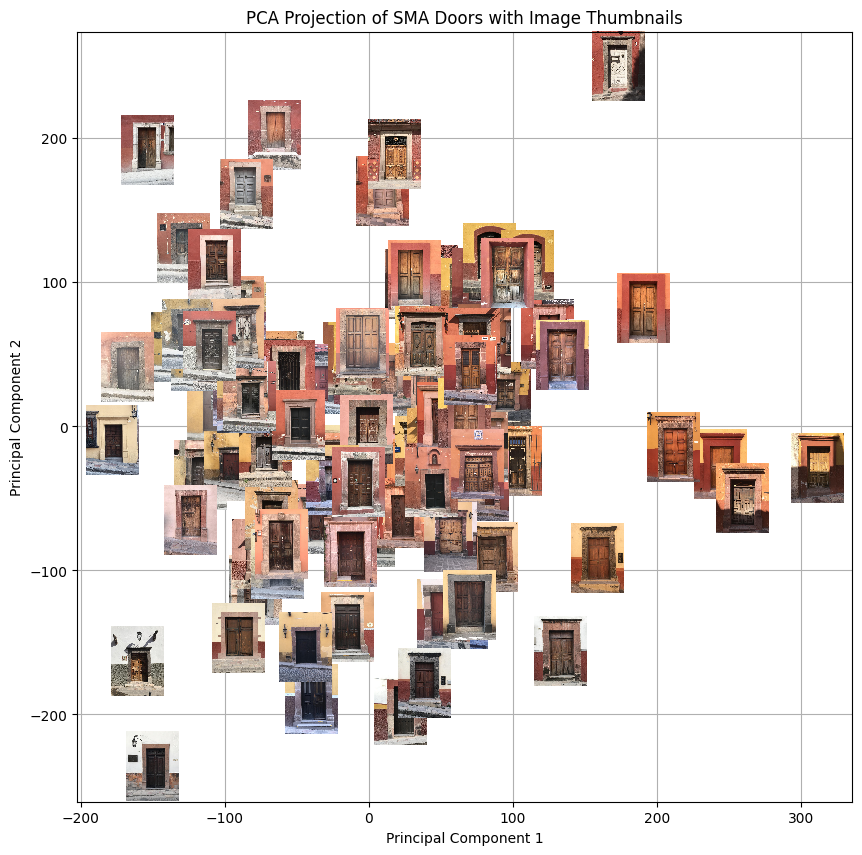

In [42]:
# Import necessary plotting tools from matplotlib
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Create the scatter plot as before
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(sma_projected[:, 0], sma_projected[:, 1], alpha=0.5, zorder=1)
ax.set_title("PCA Projection of SMA Doors with Image Thumbnails")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.grid(True)

# Define parameters for plotting the images
sample_size = 109  # Number of random doors to plot
scale_factor = 0.05  # Controls the size of the plotted images

# Select a random sample of indices
import random
random_indices = random.sample(range(len(sma_images)), min(sample_size, len(sma_images)))

# Loop through the selected indices and plot each door
for i in random_indices:
    # Get the image and its projected coordinates
    img = sma_images[i]
    x_pos = sma_projected[i, 0]
    y_pos = sma_projected[i, 1]
    
    # Create the image and position it at the correct coordinates on the plot
    imagebox = OffsetImage(img, zoom=scale_factor)
    ab = AnnotationBbox(imagebox, (x_pos, y_pos), frameon=False, pad=0.1, zorder=2)
    ax.add_artist(ab)

plt.show()

## **Lesson 5: The PCA Space Grid 🌌**
## **Lección 5: La Cuadrícula del Espacio PCA 🌌**
We can use the inverse of the PCA transformation to create new images from scratch. By sampling points on a grid across our two main principal components (PC1 and PC2), we can generate and visualize what a door would look like at any point in our PCA "door space."

---
### **Step 1: Create a Grid of Principal Component Values**
We'll use `np.linspace` to create a range of values for both PC1 and PC2. We'll then use `np.meshgrid` to create a grid of all possible combinations of these values.

### **Paso 1: Crear una Cuadrícula de Valores de Componentes Principales**
Usaremos np.linspace para crear un rango de valores para PC1 y PC2. Luego, usaremos np.meshgrid para crear una cuadrícula con todas las combinaciones posibles de estos valores.

In [29]:
# Create a range of values for PC1 and PC2
# These values should cover the spread of your data.
# You can get a good estimate from your scatter plot.
pc1_values = np.linspace(sma_projected[:, 0].min(), sma_projected[:, 0].max(), 7) 
pc2_values = np.linspace(sma_projected[:, 1].min(), sma_projected[:, 1].max(), 7)

# Create a grid from these values
pc1_grid, pc2_grid = np.meshgrid(pc1_values, pc2_values)

# Create a single array of these grid points for the inverse transform
# We need to make these 30-dimensional, with the first two dimensions from our grid, and the rest set to 0.
grid_points = np.zeros((pc1_grid.size, pca.n_components))
grid_points[:, 0] = pc1_grid.flatten()
grid_points[:, 1] = pc2_grid.flatten()

print(f"Shape of our grid points: {grid_points.shape}")

Shape of our grid points: (49, 30)


---
### **Step 2: Generate New Images with the Inverse Transform**
Now we'll use our pca model to convert these grid points back into flattened images. The inverse_transform function takes our low-dimensional data and reconstructs a high-dimensional image from it.

### **Paso 2: Generar Nuevas Imágenes con la Transformación Inversa**
Ahora usaremos nuestro modelo pca para convertir estos puntos de la cuadrícula de nuevo en imágenes aplanadas. La función inverse_transform toma nuestros datos de baja dimensión y los usa para reconstruir una imagen de alta dimensión a partir de ellos.

In [30]:
# Create an inverse PCA model with the same components
pca_inverse = PCA(n_components=2)
pca_inverse.fit(sma_data[:,:2]) # Fit on the first two components

# Use the inverse transform to generate the images
generated_images_flat = pca.inverse_transform(grid_points)

print(f"Shape of generated images data: {generated_images_flat.shape}")

Shape of generated images data: (49, 2250000)


---
### **Step 3: Visualize the Grid of Eigen-Puertas**
Finally, we'll loop through our generated images and display them on a grid. You will see how moving along the PC1 axis changes one set of features, while moving along the PC2 axis changes another set, and how combining them creates unique doors.

### **Paso 3: Visualizar la Cuadrícula de Eigen-Puertas**
Finalmente, recorreremos nuestras imágenes generadas y las mostraremos en una cuadrícula. Verás cómo moverte a lo largo del eje PC1 cambia un conjunto de características, mientras que moverte a lo largo del eje PC2 cambia otro, y cómo la combinación de ambos crea puertas únicas.

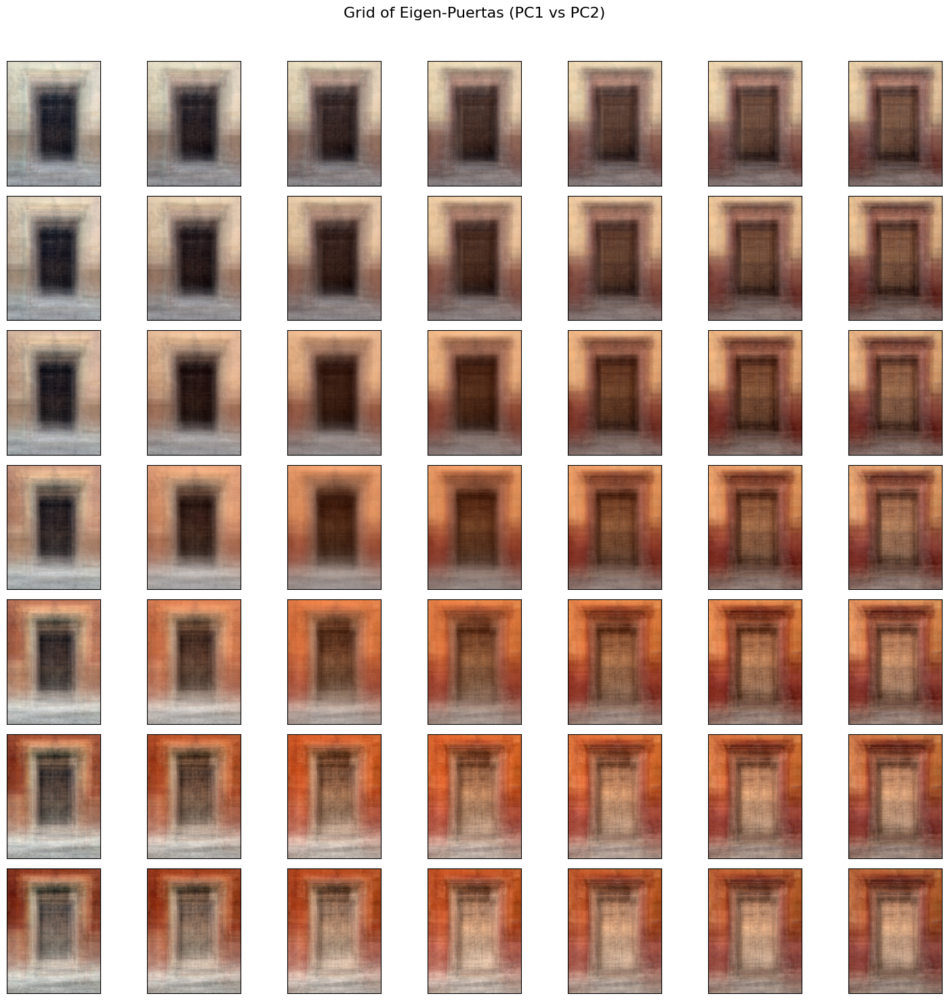

In [31]:
# Get the original dimensions from the first image
original_shape = sma_images[0].shape

# Create a figure to plot the grid
fig, axes = plt.subplots(7, 7, figsize=(15, 15))
fig.suptitle("Grid of Eigen-Puertas (PC1 vs PC2)", fontsize=16)

for i, ax in enumerate(axes.flat):
    # Reshape the flattened vector back into an image
    # We use our previously defined reshape_vector_to_image function
    img_vector = generated_images_flat[i, :]
    img = reshape_vector_to_image(img_vector, original_shape)
    
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()